# Image processing with OpenCV

OpenCV – Open Source Computer Vision. It is one of the most widely used tools for computer vision and image processing tasks. It is used in various applications such as face detection, video capturing, tracking moving objects, object disclosure, nowadays in Covid applications such as face mask detection, social distancing, and many more.



### Download the image for today

In [3]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  

--2024-07-19 21:41:22--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 473831 (463K) [image/png]
Saving to: ‘lenna.png’

lenna.png           100%[===================>] 462.73K  48.2KB/s    in 12s     

2024-07-19 21:41:36 (39.8 KB/s) - ‘lenna.png’ saved [473831/473831]

--2024-07-19 21:41:36--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-cours

First, let's define a helper function to concatenate two images side-by-side. You will need to understand this code this moment, but this function will be used repeatedly.

In [4]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

In [5]:
my_image = "baboon.png"

Image files are stored in the file system of our computer. The location of it is specified using a "path", which is often unique. You can find the path of our current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory. 


In [6]:
import os
cwd = os.getcwd()
cwd 

'/home/jagannath/CompVis/img_process_with_openCv'

In [7]:
image_path = os.path.join(cwd, my_image)
image_path

'/home/jagannath/CompVis/img_process_with_openCv/baboon.png'

### Load in Image in Python

OpenCV is a library used for computer vision. It has more functionality than the PIL library but is more difficult to use. We can import OpenCV as follows:


In [9]:
import cv2



In [10]:
image = cv2.imread(my_image)

In [11]:
type(image)

numpy.ndarray

In [12]:
image.shape

(512, 512, 3)

In [13]:
# Libraries

import pandas as pd
import numpy  as np
import matplotlib.pyplot as plt

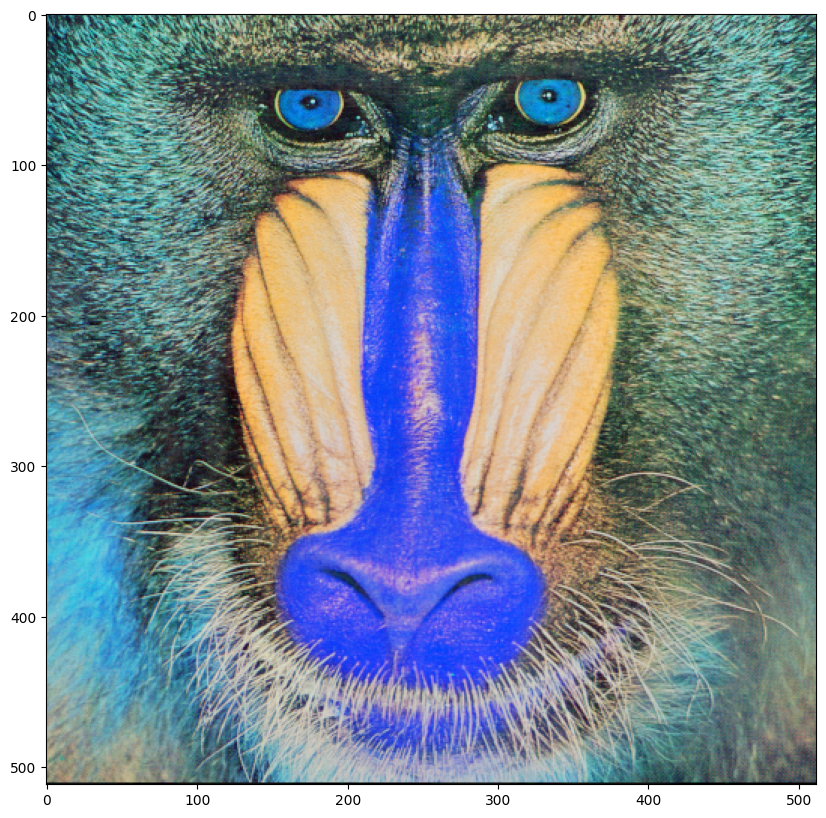

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

The image output doesn't look natural. This is because the order of RGB Channels are different. We can change the color space with conversion code and the function cvtColor from the cv2 library:


In [15]:
new_image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

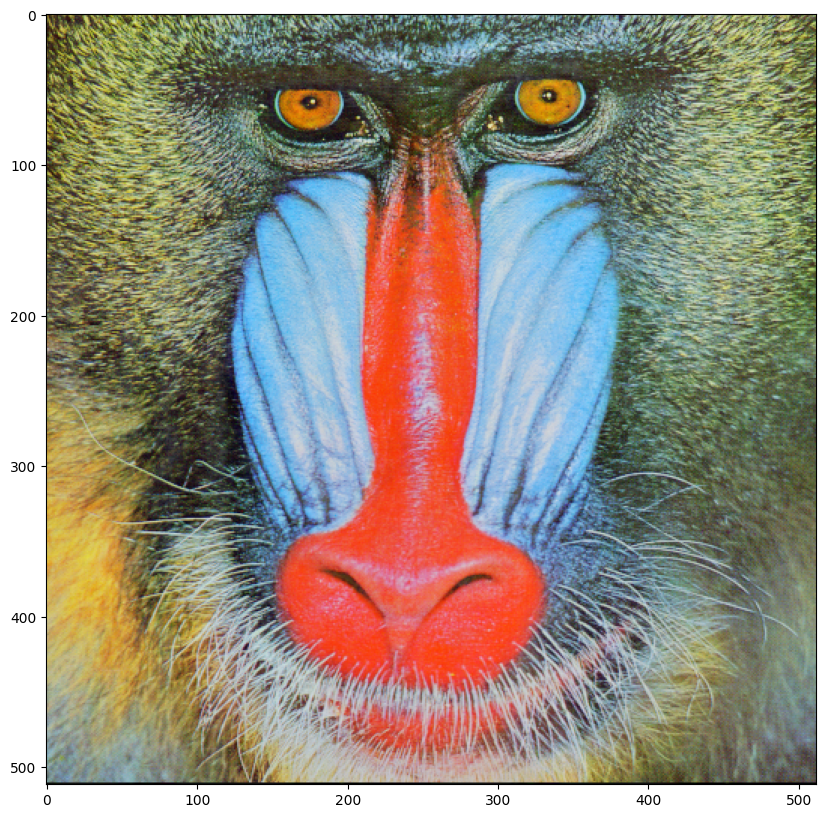

In [16]:
plt.figure(figsize=(10,10))
plt.imshow(new_image)
plt.show()

In [17]:
#  load the image using its path

image = cv2.imread(image_path)
image.shape



(512, 512, 3)

In [18]:
cv2.imwrite("baboon.jpg", image)

True

### Grayscale Images

Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function cvtColor.


The code for RGB to gray is <code>cv2.COLOR_BGR2GRAY</code>, we apply the function:


In [19]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [20]:
# The image array has only two dimensions, i.e. only one color channel:

image_gray.shape

(512, 512)

We can plot the image using imshow but we have to specify the color map is gray:

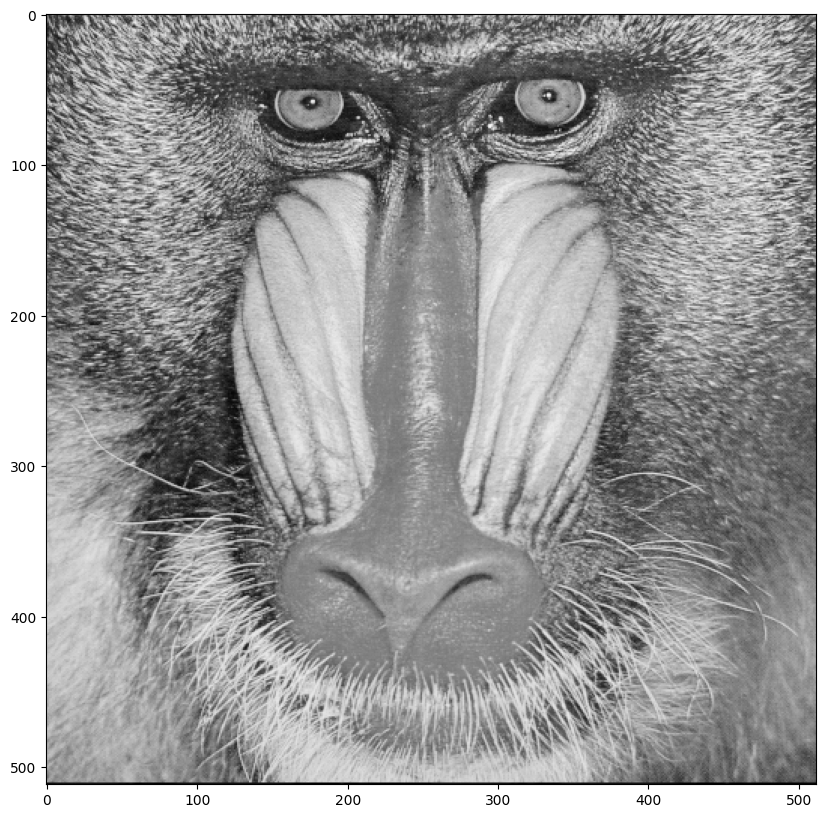

In [21]:
plt.figure(figsize=(10, 10))
plt.imshow(image_gray, cmap='gray')
plt.show()

In [22]:
# save image into jpeg
cv2.imwrite('lena_gray_cv.jpg', image_gray)

True

In [23]:
im_gray = cv2.imread('barbara.png', cv2.IMREAD_GRAYSCALE)

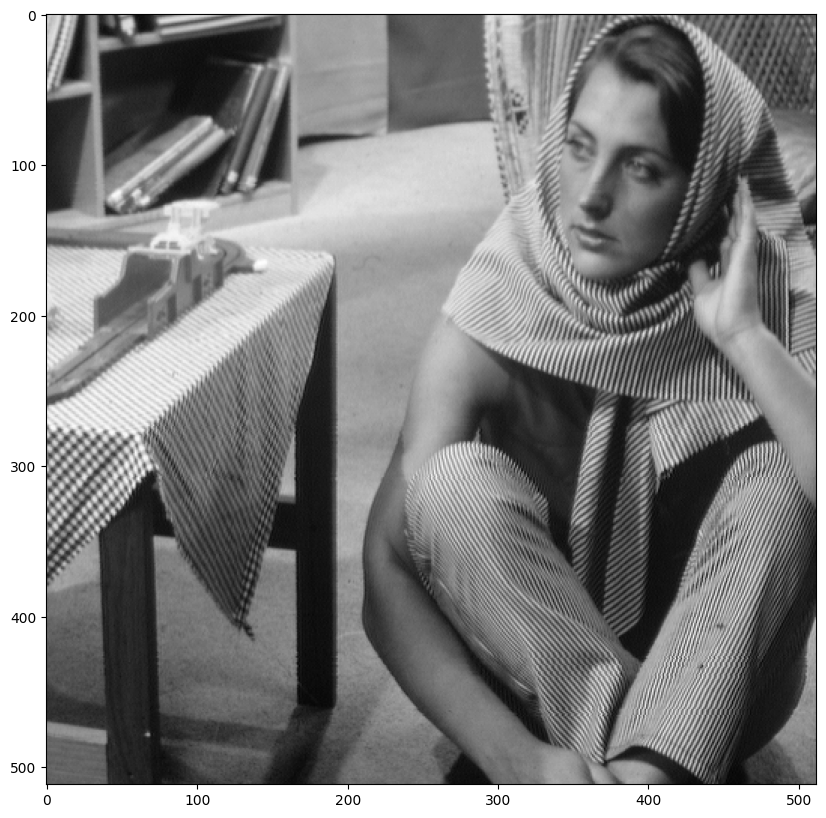

In [24]:
plt.figure(figsize=(10,10))
plt.imshow(im_gray,cmap='gray')
plt.show()

### Color Channels

We can also work with the different color channels. Consider the following image:


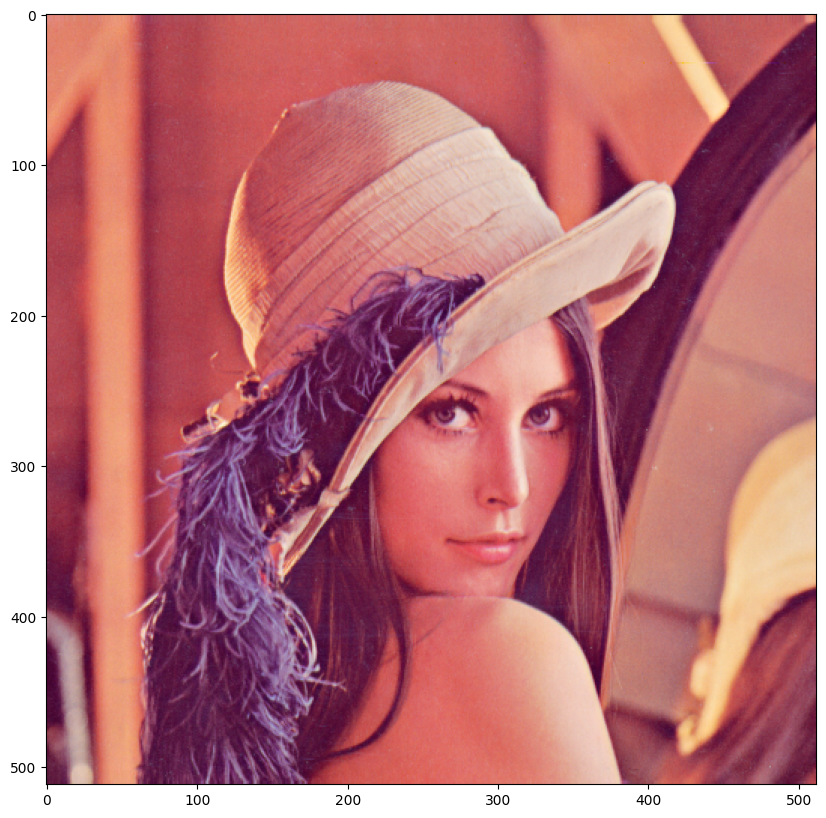

In [26]:
baboon=cv2.imread('lenna.png')
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.show()

We can obtain the different RGB colors and assign them to the variables blue, green, and red, in (B, G, R) format.

In [27]:
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2]

In [28]:
im_bgr = cv2.vconcat([blue, green, red])

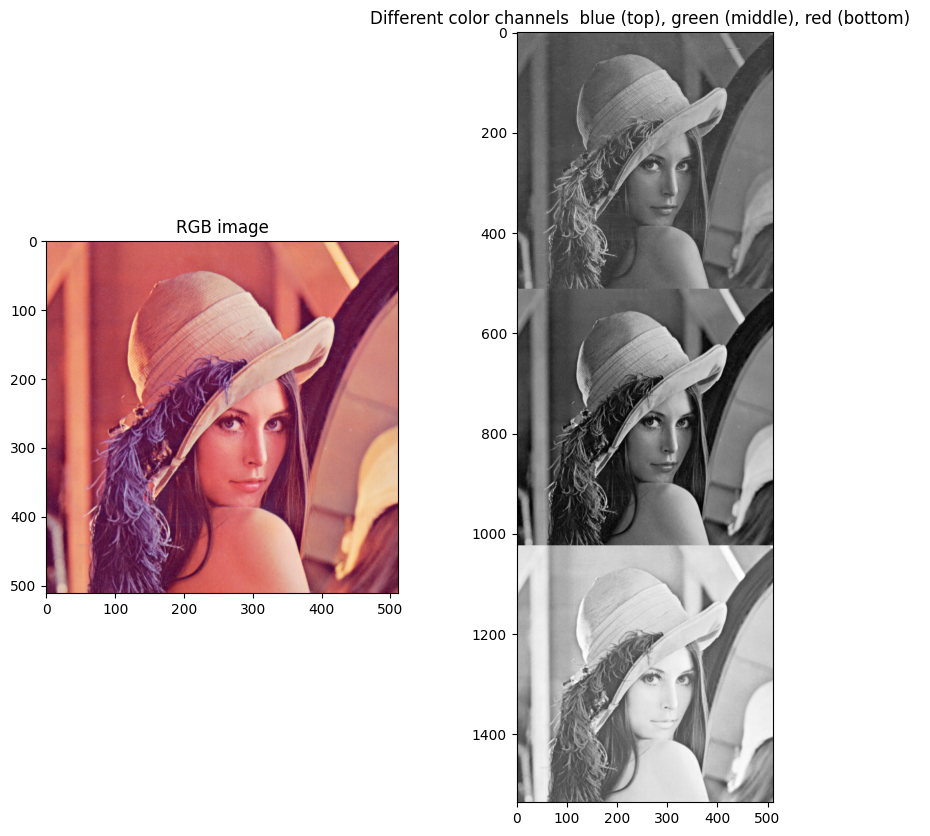

In [29]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("RGB image")
plt.subplot(122)
plt.imshow(im_bgr,cmap='gray')
plt.title("Different color channels  blue (top), green (middle), red (bottom)  ")
plt.show()

### Indexing

We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:


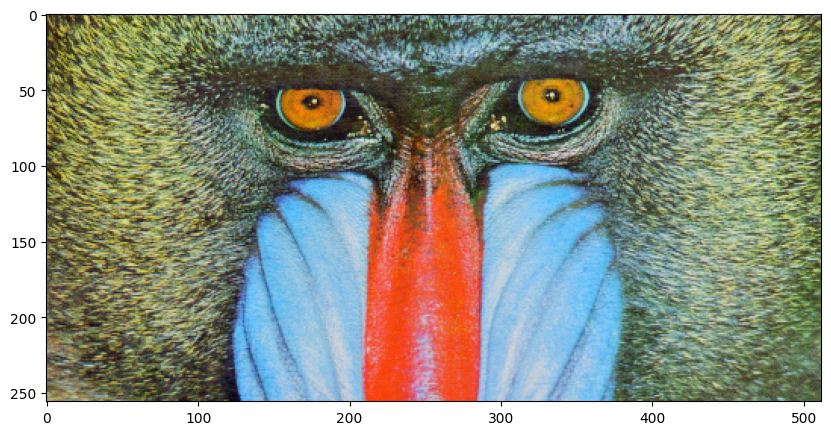

In [30]:
rows = 256

plt.figure(figsize=(10,10))
plt.imshow(new_image[0:rows,:,:])
plt.show()

In [31]:
# We can also return the first 256 columns corresponding to the first half of the image:

columns = 256

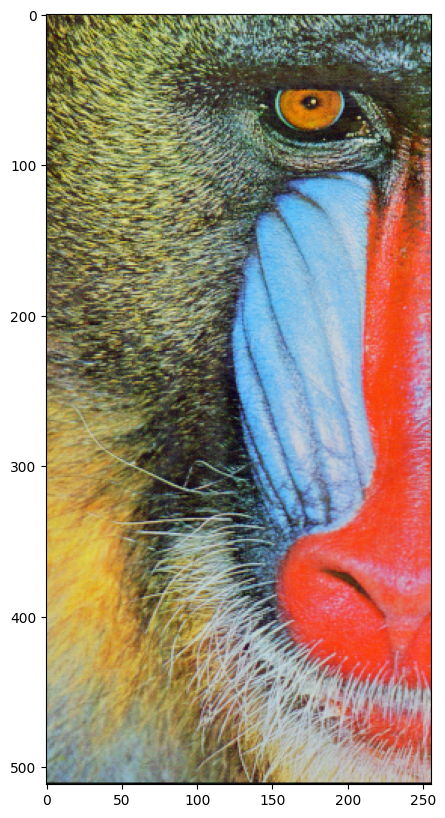

In [32]:
plt.figure(figsize=(10,10))
plt.imshow(new_image[:,0:columns,:])
plt.show()

We can also manipulate elements using indexing. In the following piece of code, we create a new array lenna_red and set all but the red color channels to zero. Therefore, when we display the image, it appears red:

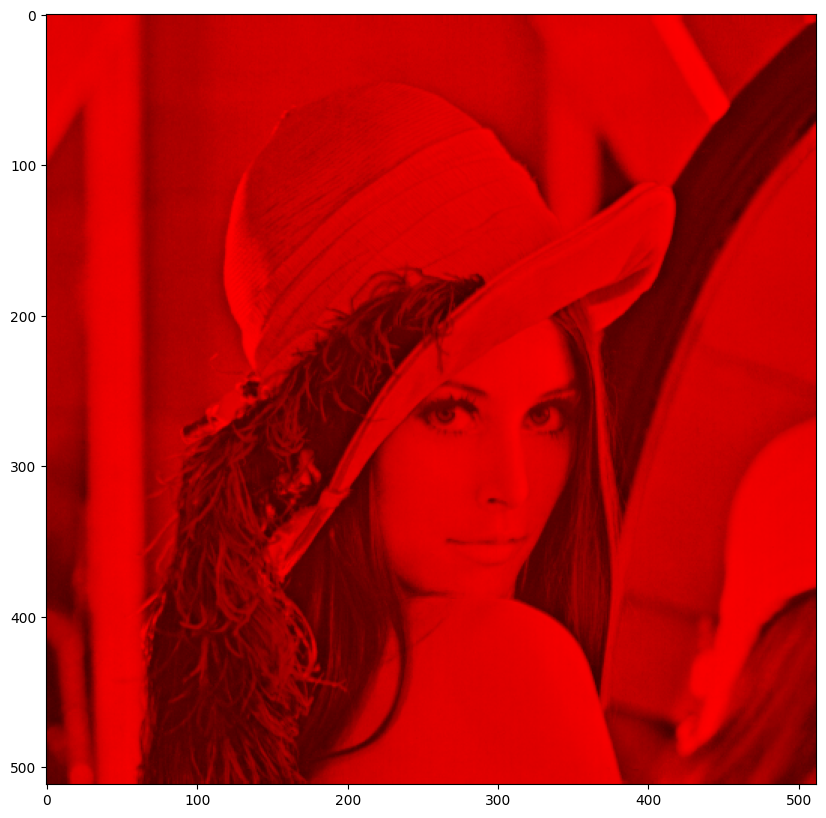

In [34]:
baboon_red = baboon.copy()
baboon_red[:, :, 0] = 0
baboon_red[:, :, 1] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB))
plt.show()

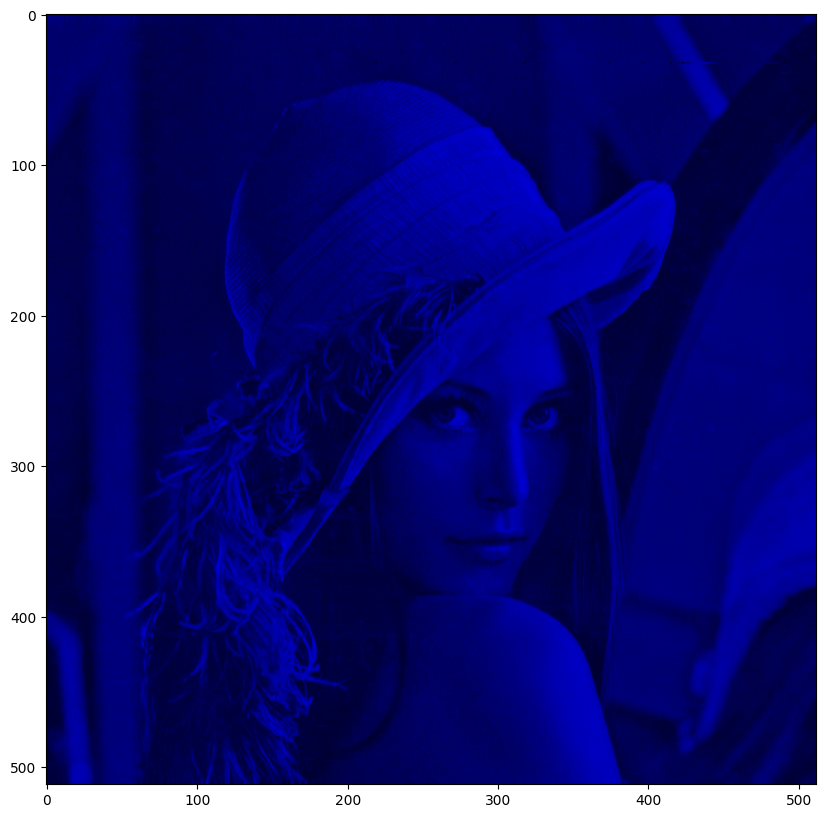

In [35]:
baboon_blue = baboon.copy()
baboon_blue[:, :, 1] = 0
baboon_blue[:, :, 2] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))
plt.show()